In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from torchvision.transforms import ToTensor
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms, models
import torchvision
from torchinfo import summary
from torch.utils.data import Dataset, DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score
import cv2
import glob
from pandas.core.common import flatten
import gc

!pip install lightning
from torchmetrics.classification import MulticlassF1Score, MulticlassConfusionMatrix

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 34.6 MB/s eta 0:00:00


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# Required functions

In [1]:
train_path = '/kaggle/input/asl-alphabet/asl_alphabet_train/asl_alphabet_train/'
test_path = '/kaggle/input/asl-alphabet/asl_alphabet_test/asl_alphabet_test/'

BATCH_SIZE = 64
EPOCHS = 4

TRAIN_LOSS_LOG = {
    # archive the loss of model
    "ASL_First_CNN": [],
    "ASL_Second_CNN" : [],
    "AlexNet" : [],
    "GoogLeNet" : [],
    "ResNet18" : [],
    "ResNet50" : [],
    "ResNet152" : [],
    "VGG11": [],
    "VGG16": []
}

TRAIN_ACC_LOG = {
    # archive the accuracy of the model
    "ASL_First_CNN": [],
    "ASL_Second_CNN" : [],
    "AlexNet" : [],
    "GoogLeNet" : [],
    "ResNet18" : [],
    "ResNet50" : [],
    "ResNet152" : [],
    "VGG11": [],
    "VGG16": []
}

VALID_LOSS_LOG = {
    "ASL_First_CNN": [],
    "ASL_Second_CNN" : [],
    "AlexNet" : [],
    "GoogLeNet" : [],
    "ResNet18" : [],
    "ResNet50" : [],
    "ResNet152" : [],
    "VGG11": [],
    "VGG16": []
}

VALID_ACC_LOG = {
    "ASL_First_CNN": [],
    "ASL_Second_CNN" : [],
    "AlexNet" : [],
    "GoogLeNet" : [],
    "ResNet18" : [],
    "ResNet50" : [],
    "ResNet152" : [],
    "VGG11": [],
    "VGG16": []
}

TRAIN_F1_LOG = {
    "ASL_First_CNN": [],
    "ASL_Second_CNN" : [],
    "AlexNet" : [],
    "GoogLeNet" : [],
    "ResNet18" : [],
    "ResNet50" : [],
    "ResNet152" : [],
    "VGG11": [],
    "VGG16": []
}

VALID_F1_LOG = {
    "ASL_First_CNN": [],
    "ASL_Second_CNN" : [],
    "AlexNet" : [],
    "GoogLeNet" : [],
    "ResNet18" : [],
    "ResNet50" : [],
    "ResNet152" : [],
    "VGG11": [],
    "VGG16": []
}

In [ ]:
def label_encoder(folderName):
    ''' encode the categorical labels to numerical '''

    if folderName in ['A']:
        label = 0
    elif folderName in ['B']:
        label = 1
    elif folderName in ['C']:
        label = 2
    elif folderName in ['D']:
        label = 3
    elif folderName in ['E']:
        label = 4
    elif folderName in ['F']:
        label = 5
    elif folderName in ['G']:
        label = 6
    elif folderName in ['H']:
        label = 7
    elif folderName in ['I']:
        label = 8
    elif folderName in ['J']:
        label = 9
    elif folderName in ['K']:
        label = 10
    elif folderName in ['L']:
        label = 11
    elif folderName in ['M']:
        label = 12
    elif folderName in ['N']:
        label = 13
    elif folderName in ['O']:
        label = 14
    elif folderName in ['P']:
        label = 15
    elif folderName in ['Q']:
        label = 16
    elif folderName in ['R']:
        label = 17
    elif folderName in ['S']:
        label = 18
    elif folderName in ['T']:
        label = 19
    elif folderName in ['U']:
        label = 20
    elif folderName in ['V']:
        label = 21
    elif folderName in ['W']:
        label = 22
    elif folderName in ['X']:
        label = 23
    elif folderName in ['Y']:
        label = 24
    elif folderName in ['Z']:
        label = 25
    elif folderName in ['del']:
        label = 26
    elif folderName in ['nothing']:
        label = 27
    elif folderName in ['space']:
        label = 28
    else:
        label = 29
    return label

In [ ]:
def model_summary(model):
    ''' return summary of cnn model with torchinfo library '''

    return summary(model=model,
        input_size=(BATCH_SIZE, 3, 200, 200),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

In [ ]:
def train_test_model(model, optimizer, loss, n_epochs=EPOCHS):
    ''' train & valid the model and monitoring the logs '''
    scaler = torch.cuda.amp.GradScaler()        # we use the amp so that less VRAM of GPU is used

    for epoch in range(n_epochs):
        train_running_loss = 0.0
        valid_running_loss = 0.0
        train_accuracy = 0.0
        train_count = 0.0
        valid_accuracy = 0.0
        valid_count = 0.0
        f1_train = 0.0
        f1_valid = 0.0
        Mat_metrix_train = MulticlassConfusionMatrix(num_classes=29).to(device)     # get confusion matrix for model
        Mat_metrix_valid = MulticlassConfusionMatrix(num_classes=29).to(device)


        with tqdm(train_loader, unit="batch") as tepoch:
            for inputs, labels in tepoch:
                tepoch.set_description(f"Train Epoch [{epoch+1}/{n_epochs}] ")

                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.autocast(device_type="cuda", dtype=torch.float16):
                    y_pred = model(inputs)
                    loss = loss_fn(y_pred, labels)

                f1_metric = MulticlassF1Score(num_classes=29).to(device)
                f1_metric.update(y_pred,labels)           # update the f1_metric on all predicted data
                f1_tmp = f1_metric(y_pred,labels).item()
                f1_train += f1_tmp

                Mat_metrix_train.update(y_pred,labels)    # update the confusion matrix on all predicted data

                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()

                train_running_loss += loss.item() * inputs.size(0)
                tmp = (torch.argmax(y_pred, 1) == labels).float().sum()
                train_accuracy += tmp
                train_count += len(labels)
                tepoch.set_postfix(f1 = f1_tmp *100, loss = loss.item(), accuracy = tmp.item()*100 / BATCH_SIZE)    # tqdm settings


        with torch.no_grad():
            with tqdm(valid_loader, unit="batch") as vepoch:
                for inputs, labels in vepoch:
                    vepoch.set_description(f"Valid Epoch [{epoch+1}/{n_epochs}] ")

                    inputs, labels = inputs.to(device), labels.to(device)
                    y_pred = model(inputs)
                    loss = loss_fn(y_pred, labels)

                    f1_metric_valid = MulticlassF1Score(num_classes=29).to(device)
                    f1_metric_valid.update(y_pred,labels)
                    f1_tnp = f1_metric_valid(y_pred,labels).item()
                    f1_valid += f1_tnp

                    Mat_metrix_valid.update(y_pred,labels)

                    valid_running_loss += loss.item() * inputs.size(0)
                    tnp = (torch.argmax(y_pred, 1) == labels).float().sum()
                    valid_accuracy += tnp
                    valid_count += len(labels)

                    vepoch.set_postfix(f1 = f1_tnp*100, loss = loss.item(), accuracy = tnp.item()*100 / BATCH_SIZE)

        train_accuracy /= train_count
        valid_accuracy /= valid_count
        train_loss = (train_running_loss / len(train_loader.dataset))
        valid_loss = (valid_running_loss / len(valid_loader.dataset))
        f1_train /= len(train_loader)
        f1_valid /= len(valid_loader)

        TRAIN_LOSS_LOG[model.__class__.__name__].append(train_loss)
        VALID_LOSS_LOG[model.__class__.__name__].append(valid_loss)
        TRAIN_ACC_LOG[model.__class__.__name__].append(train_accuracy * 100)
        VALID_ACC_LOG[model.__class__.__name__].append(valid_accuracy * 100)
        TRAIN_F1_LOG[model.__class__.__name__].append(f1_train *100)
        VALID_F1_LOG[model.__class__.__name__].append(f1_valid *100)

        print("Epoch %d, mean train loss: %.2f, train accuracy: %.2f, Train f1_score: %.2f, mean valid loss: %.2f, valid accuracy: %.2f, Valid f1_score: %.2f"
              % (epoch+1, train_loss, train_accuracy* 100, f1_train*100, valid_loss, valid_accuracy* 100, f1_valid*100))

        fig, ax = plt.subplots(1, 2, figsize=(25,25))
        Mat_metrix_train.plot(ax=ax[0])     # plot confusion matrix for model
        Mat_metrix_valid.plot(ax=ax[1])
        plt.show()


# Create DataSet

In [ ]:
train_image_paths = []
# classes = []

for data_path in glob.glob(train_path + '/*'):
#     classes.append(data_path.split('/')[-1])
    train_image_paths.append(glob.glob(data_path + '/*'))   # export train_image path from data_path

train_image_paths = list(flatten(train_image_paths))

train_paths, valid_paths = train_test_split(train_image_paths, test_size=0.25, shuffle=True)    # split data to train & valid

In [ ]:
class ASL_Dataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]      # path of each image
        image = cv2.imread(image_path)          # read image form .jpg
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)      # convert BGR image to RGB

        label = image_path.split('/')[-2]       # export label of image from image_path
        label = label_encoder(label)            # encode the categorical labels to numerical

        if self.transform:
            image = self.transform(image)       # apply transform on image
        return image, label


train_dataset = ASL_Dataset(train_paths, ToTensor())    # create the dataset from paths and transform them to Tensor
valid_dataset = ASL_Dataset(valid_paths, ToTensor())
test_dataset = ASL_Dataset(test_path, ToTensor())

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)   # create dataloader  and shuffle them
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

## Visualization Data

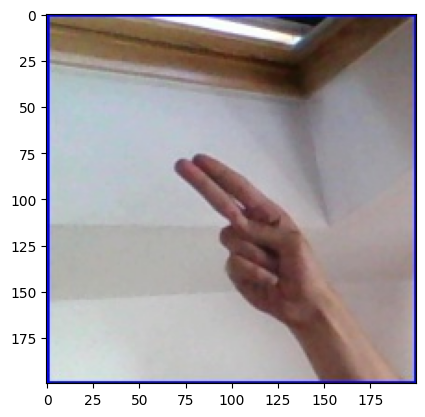

In [ ]:
for image,label in train_dataset:
    # show sample of image
    image = image.detach()
    image = torchvision.transforms.functional.to_pil_image(image)
    plt.imshow(np.asarray(image))
    plt.show()
#     print(label)
    break

# CNN Model

In [ ]:
class ASL_First_CNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
            # 3*200*200 --> 64*100*100
            nn.Conv2d(3, 64, kernel_size=5, stride=2, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            # 64*100*100 --> 64*50*50
            nn.MaxPool2d(kernel_size=2),

            # 64*50*50 --> 64*25*25
            nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            # 64*25*25 --> 128*13*13
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            # 128*13*13 --> 128*3*3
            nn.AdaptiveAvgPool2d((3,3))
        )

        self.fc = nn.Sequential(
            nn.Flatten(),

            nn.Dropout(0.4),
            nn.Linear(128*3*3, 1024),
            nn.ReLU(inplace=True),

            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),

            nn.Dropout(0.2),
            nn.Linear(512, 29),
#             nn.Softmax()
        )

    def forward(self, x):
        x = self.conv(x)
        x = self.fc(x)
        return x

model = ASL_First_CNN().to(device)

In [ ]:
model_summary(model)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ASL_First_CNN (ASL_First_CNN)            [64, 3, 200, 200]    [64, 29]             --                   True
├─Sequential (conv)                      [64, 3, 200, 200]    [64, 128, 3, 3]      --                   True
│    └─Conv2d (0)                        [64, 3, 200, 200]    [64, 64, 100, 100]   4,864                True
│    └─BatchNorm2d (1)                   [64, 64, 100, 100]   [64, 64, 100, 100]   128                  True
│    └─ReLU (2)                          [64, 64, 100, 100]   [64, 64, 100, 100]   --                   --
│    └─MaxPool2d (3)                     [64, 64, 100, 100]   [64, 64, 50, 50]     --                   --
│    └─Conv2d (4)                        [64, 64, 50, 50]     [64, 64, 25, 25]     36,928               True
│    └─BatchNorm2d (5)                   [64, 64, 25, 25]     [64, 64, 25, 25]     128                  True
│    └─ReLU (6)   

Valid Epoch [1/4] : 100%|██████████| 340/340 [02:58<00:00,  1.90batch/s, accuracy=59.4, f1=59.4, loss=0.908]


Epoch 1, mean train loss: 1.34, train accuracy: 54.71, Train f1_score: 48.08, mean valid loss: 0.66, valid accuracy: 76.40, Valid f1_score: 70.07


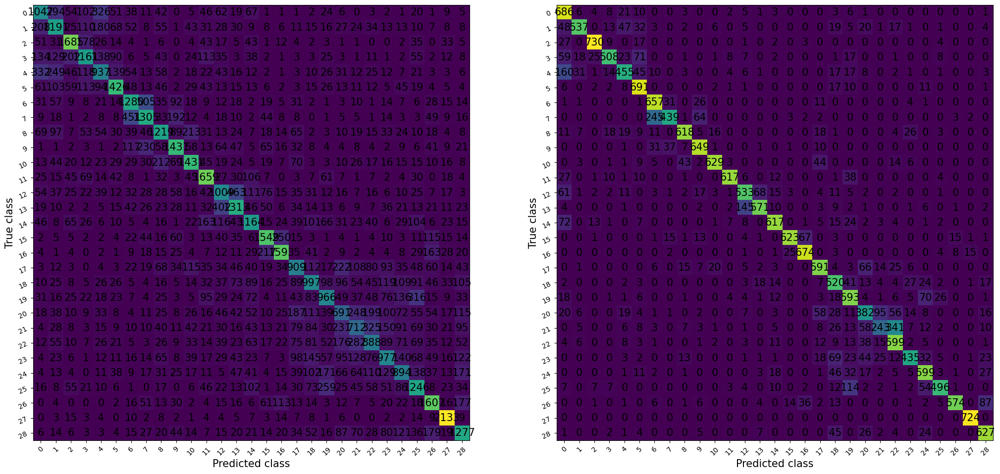

Valid Epoch [2/4] : 100%|██████████| 340/340 [00:47<00:00,  7.23batch/s, accuracy=75, f1=85.6, loss=0.333]


Epoch 2, mean train loss: 0.49, train accuracy: 82.44, Train f1_score: 77.27, mean valid loss: 0.39, valid accuracy: 86.05, Valid f1_score: 81.87


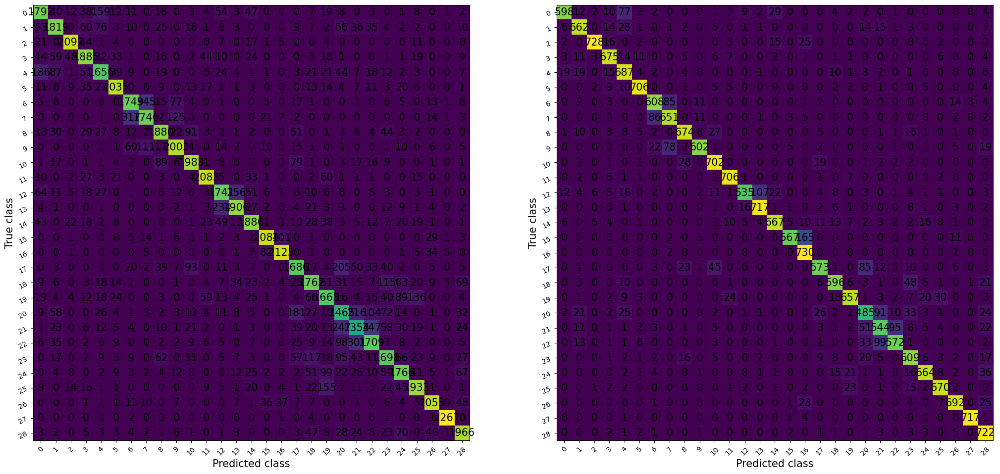

Valid Epoch [3/4] : 100%|██████████| 340/340 [00:47<00:00,  7.22batch/s, accuracy=78.1, f1=89.8, loss=0.152]


Epoch 3, mean train loss: 0.31, train accuracy: 88.87, Train f1_score: 85.07, mean valid loss: 0.24, valid accuracy: 91.46, Valid f1_score: 88.56


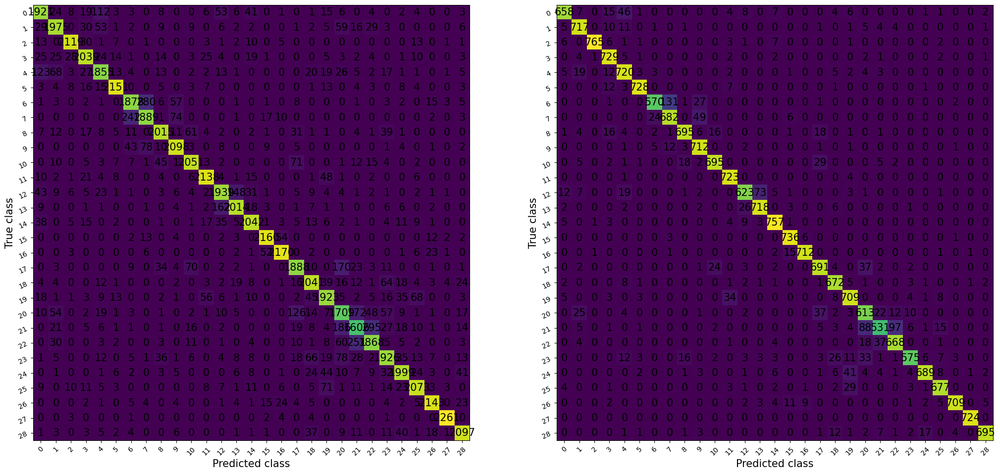

Valid Epoch [4/4] : 100%|██████████| 340/340 [00:46<00:00,  7.28batch/s, accuracy=70.3, f1=77.5, loss=0.468]


Epoch 4, mean train loss: 0.22, train accuracy: 92.04, Train f1_score: 89.19, mean valid loss: 0.19, valid accuracy: 93.28, Valid f1_score: 90.95


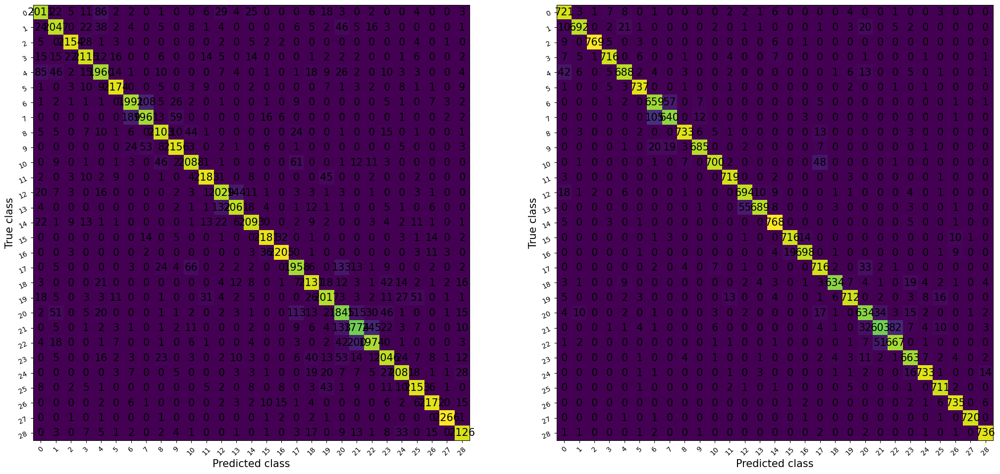

In [ ]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

train_test_model(model, optimizer, loss_fn)

In [ ]:
del model       # delete the model var from ram becuase it doesn't duplicate with new model var
torch.cuda.empty_cache()    # allocate the VRAM of GPU
gc.collect()

torch.cuda.empty_cache()
gc.collect()

0

In [ ]:
class ASL_Second_CNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.cn1 = nn.Sequential(
            nn.Conv2d(3, 128, kernel_size=6, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((3,3)),

            nn.Flatten(),
            nn.Linear(2304, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, 29),
        )

    def forward(self, x):
        x = self.cn1(x)
        return x

model = ASL_Second_CNN().to(device)

In [ ]:
model_summary(model)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ASL_Second_CNN (ASL_Second_CNN)          [64, 3, 200, 200]    [64, 29]             --                   True
├─Sequential (cn1)                       [64, 3, 200, 200]    [64, 29]             --                   True
│    └─Conv2d (0)                        [64, 3, 200, 200]    [64, 128, 50, 50]    13,952               True
│    └─ReLU (1)                          [64, 128, 50, 50]    [64, 128, 50, 50]    --                   --
│    └─MaxPool2d (2)                     [64, 128, 50, 50]    [64, 128, 25, 25]    --                   --
│    └─Conv2d (3)                        [64, 128, 25, 25]    [64, 256, 13, 13]    295,168              True
│    └─ReLU (4)                          [64, 256, 13, 13]    [64, 256, 13, 13]    --                   --
│    └─Conv2d (5)                        [64, 256, 13, 13]    [64, 256, 7, 7]      590,080              True
│    └─ReLU (6)     

Valid Epoch [1/4] : 100%|██████████| 340/340 [00:45<00:00,  7.49batch/s, accuracy=62.5, f1=66.1, loss=0.758]


Epoch 1, mean train loss: 1.83, train accuracy: 40.78, Train f1_score: 34.55, mean valid loss: 0.83, valid accuracy: 69.91, Valid f1_score: 62.90


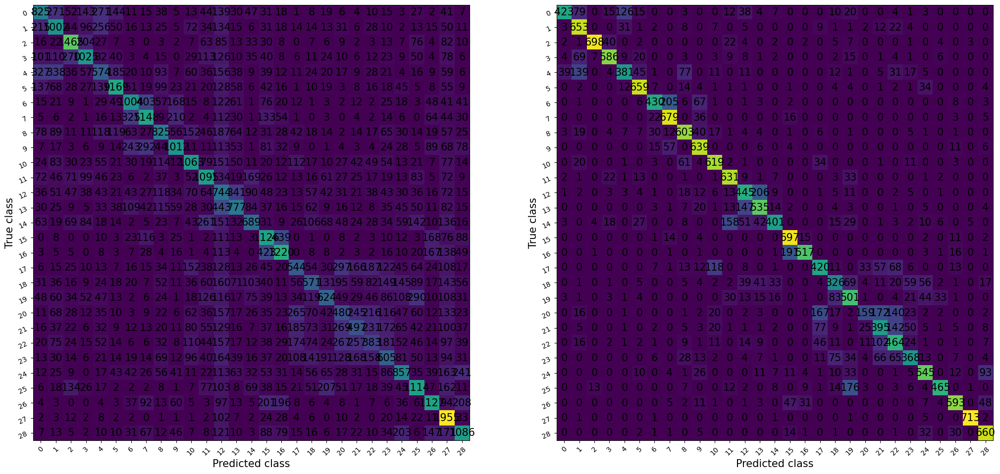

Valid Epoch [2/4] : 100%|██████████| 340/340 [00:45<00:00,  7.49batch/s, accuracy=71.9, f1=75.1, loss=0.464]


Epoch 2, mean train loss: 0.53, train accuracy: 80.98, Train f1_score: 75.88, mean valid loss: 0.35, valid accuracy: 87.69, Valid f1_score: 83.64


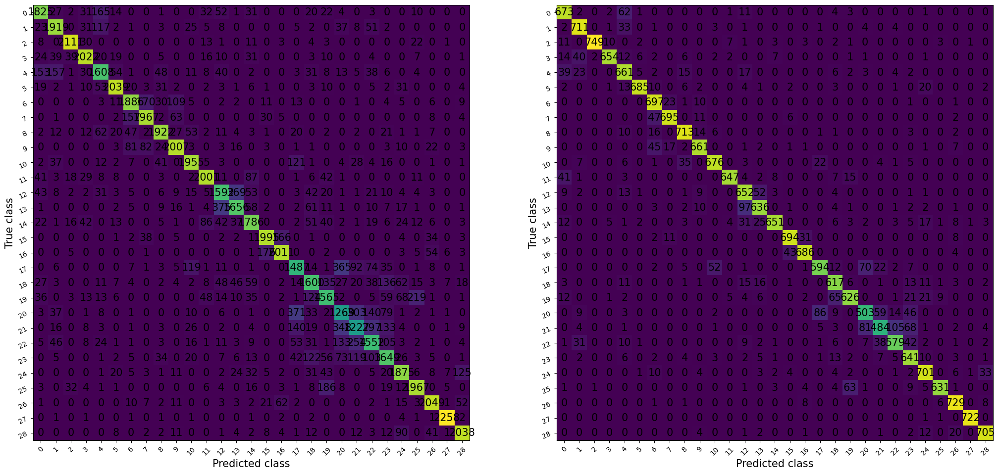

Valid Epoch [3/4] : 100%|██████████| 340/340 [00:47<00:00,  7.22batch/s, accuracy=68.8, f1=81.7, loss=0.369]


Epoch 3, mean train loss: 0.26, train accuracy: 90.89, Train f1_score: 87.76, mean valid loss: 0.21, valid accuracy: 92.47, Valid f1_score: 89.87


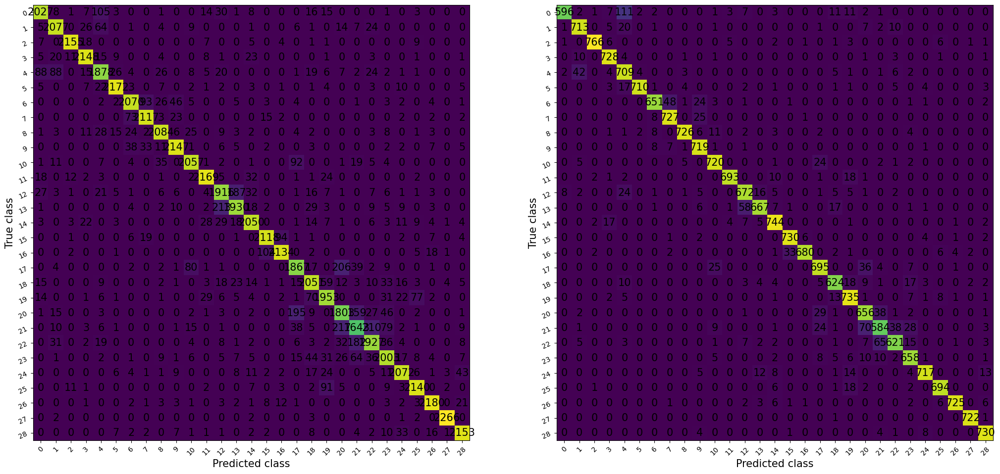

Valid Epoch [4/4] : 100%|██████████| 340/340 [00:48<00:00,  7.05batch/s, accuracy=81.2, f1=93.6, loss=0.136]


Epoch 4, mean train loss: 0.17, train accuracy: 94.10, Train f1_score: 91.82, mean valid loss: 0.14, valid accuracy: 95.32, Valid f1_score: 93.48


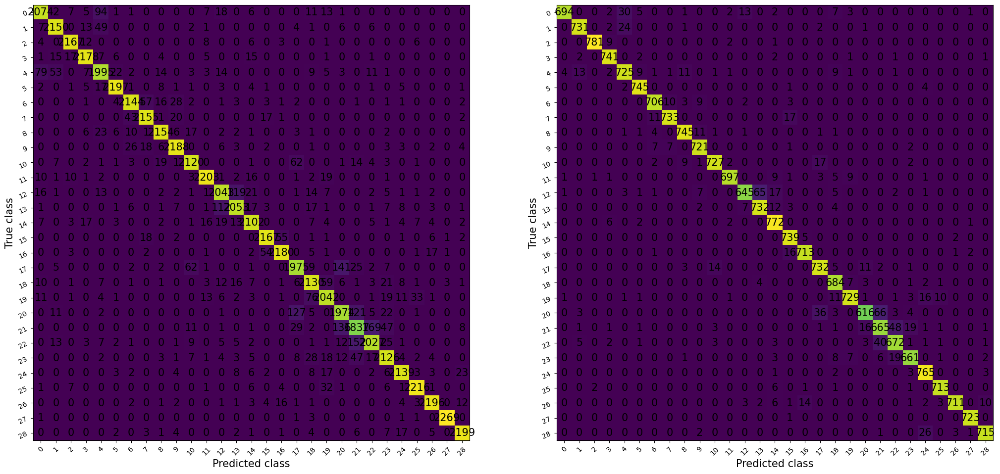

In [ ]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


train_test_model(model, optimizer, loss_fn)

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

torch.cuda.empty_cache()
gc.collect()

0

# Transfer Learning

### AlexNet

In [ ]:
weights = torchvision.models.AlexNet_Weights.DEFAULT    #DEFAULT = best available weights
model = torchvision.models.alexnet(weights=weights).to(device)

# model_summary(model)

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 160MB/s]


In [ ]:
for param in model.features.parameters():
    param.requires_grad = False     # don't backpropagation on convolution layers

model.classifier = torch.nn.Sequential(     # change the fully connected layer, and change the number of classification
    torch.nn.Dropout(p=0.2, inplace=True),
    torch.nn.Linear(in_features=9216,
                    out_features=1024,
                    bias=True),
#     torch.nn.ReLU(inplace=True),

    torch.nn.Dropout(p=0.2, inplace=True),
    torch.nn.Linear(in_features=1024,
                    out_features=512,
                    bias=True),
#     torch.nn.ReLU(inplace=True),

    torch.nn.Dropout(p=0.2, inplace=True),
    torch.nn.Linear(in_features=512,
                    out_features=29,
                    bias=True)).to(device)

model_summary(model)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
AlexNet (AlexNet)                        [64, 3, 200, 200]    [64, 29]             --                   Partial
├─Sequential (features)                  [64, 3, 200, 200]    [64, 256, 5, 5]      --                   False
│    └─Conv2d (0)                        [64, 3, 200, 200]    [64, 64, 49, 49]     (23,296)             False
│    └─ReLU (1)                          [64, 64, 49, 49]     [64, 64, 49, 49]     --                   --
│    └─MaxPool2d (2)                     [64, 64, 49, 49]     [64, 64, 24, 24]     --                   --
│    └─Conv2d (3)                        [64, 64, 24, 24]     [64, 192, 24, 24]    (307,392)            False
│    └─ReLU (4)                          [64, 192, 24, 24]    [64, 192, 24, 24]    --                   --
│    └─MaxPool2d (5)                     [64, 192, 24, 24]    [64, 192, 11, 11]    --                   --
│    └─Conv2d (6

Valid Epoch [1/4] : 100%|██████████| 340/340 [00:49<00:00,  6.89batch/s, accuracy=79.7, f1=91.7, loss=0.528]


Epoch 1, mean train loss: 0.94, train accuracy: 82.60, Train f1_score: 77.98, mean valid loss: 0.64, valid accuracy: 90.87, Valid f1_score: 87.79


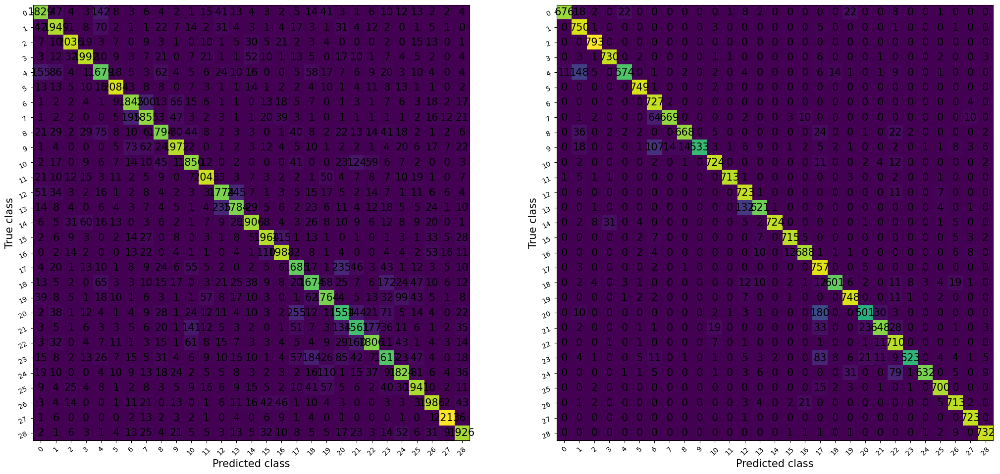

Valid Epoch [2/4] : 100%|██████████| 340/340 [00:46<00:00,  7.29batch/s, accuracy=75, f1=84.5, loss=2.29]


Epoch 2, mean train loss: 1.29, train accuracy: 89.85, Train f1_score: 86.50, mean valid loss: 1.52, valid accuracy: 91.54, Valid f1_score: 88.79


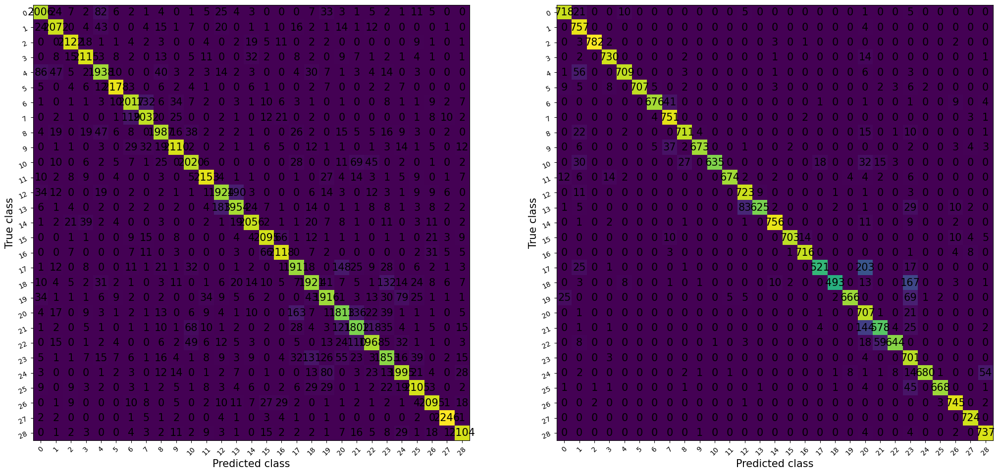

Valid Epoch [3/4] : 100%|██████████| 340/340 [00:53<00:00,  6.33batch/s, accuracy=76.6, f1=86.5, loss=3.17]


Epoch 3, mean train loss: 1.46, train accuracy: 92.96, Train f1_score: 90.35, mean valid loss: 2.11, valid accuracy: 92.46, Valid f1_score: 89.92


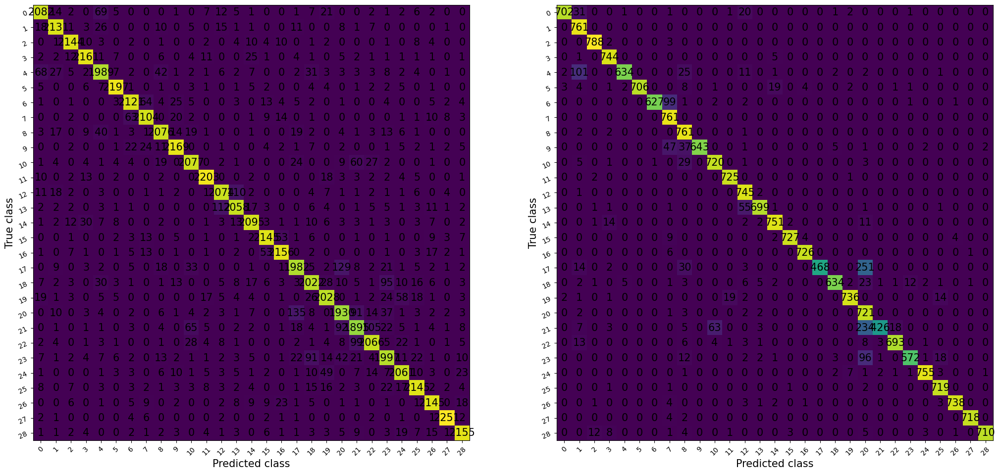

Valid Epoch [4/4] : 100%|██████████| 340/340 [00:47<00:00,  7.11batch/s, accuracy=81.2, f1=96.3, loss=1.19]


Epoch 4, mean train loss: 1.70, train accuracy: 94.33, Train f1_score: 92.37, mean valid loss: 0.98, valid accuracy: 96.40, Valid f1_score: 94.92


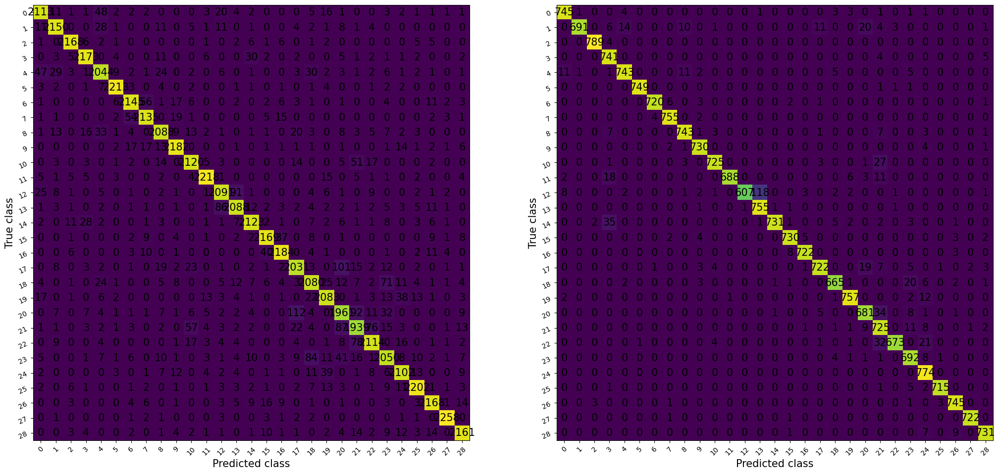

In [ ]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

train_test_model(model, optimizer, loss_fn)

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

torch.cuda.empty_cache()
gc.collect()

0

### GoogLeNet

In [ ]:
weights = torchvision.models.GoogLeNet_Weights.DEFAULT    #DEFAULT = best available weights
model = torchvision.models.googlenet(weights=weights).to(device)

# model_summary(model)

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 151MB/s]


In [ ]:
for param in model.conv1.parameters():
    param.requires_grad = False
for param in model.conv2.parameters():
    param.requires_grad = False
for param in model.conv3.parameters():
    param.requires_grad = False

for param in model.inception3a.parameters():
    param.requires_grad = False
for param in model.inception3b.parameters():
    param.requires_grad = False
for param in model.inception4a.parameters():
    param.requires_grad = False
for param in model.inception4b.parameters():
    param.requires_grad = False
for param in model.inception5a.parameters():
    param.requires_grad = False
for param in model.inception5b.parameters():
    param.requires_grad = False

model.fc = torch.nn.Sequential(
    torch.nn.Linear(in_features=1024,
                    out_features=512,
                    bias=True),
#     torch.nn.ReLU(inplace=True),

    torch.nn.Linear(in_features=512,
                    out_features=29,
                    bias=True)).to(device)

model_summary(model)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
GoogLeNet (GoogLeNet)                    [64, 3, 200, 200]    [64, 29]             --                   Partial
├─BasicConv2d (conv1)                    [64, 3, 200, 200]    [64, 64, 100, 100]   --                   False
│    └─Conv2d (conv)                     [64, 3, 200, 200]    [64, 64, 100, 100]   (9,408)              False
│    └─BatchNorm2d (bn)                  [64, 64, 100, 100]   [64, 64, 100, 100]   (128)                False
├─MaxPool2d (maxpool1)                   [64, 64, 100, 100]   [64, 64, 50, 50]     --                   --
├─BasicConv2d (conv2)                    [64, 64, 50, 50]     [64, 64, 50, 50]     --                   False
│    └─Conv2d (conv)                     [64, 64, 50, 50]     [64, 64, 50, 50]     (4,096)              False
│    └─BatchNorm2d (bn)                  [64, 64, 50, 50]     [64, 64, 50, 50]     (128)                False
├─Basic

Valid Epoch [1/4] : 100%|██████████| 340/340 [01:00<00:00,  5.58batch/s, accuracy=84.4, f1=100, loss=0.0108]


Epoch 1, mean train loss: 0.08, train accuracy: 97.79, Train f1_score: 97.12, mean valid loss: 0.02, valid accuracy: 99.27, Valid f1_score: 98.80


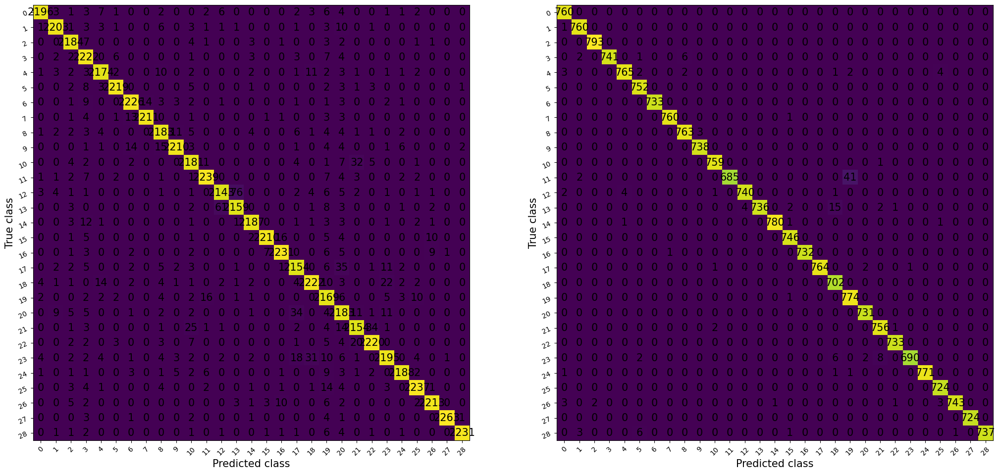

Valid Epoch [2/4] : 100%|██████████| 340/340 [01:00<00:00,  5.63batch/s, accuracy=84.4, f1=100, loss=2.79e-6]


Epoch 2, mean train loss: 0.03, train accuracy: 99.33, Train f1_score: 98.93, mean valid loss: 0.02, valid accuracy: 99.54, Valid f1_score: 99.27


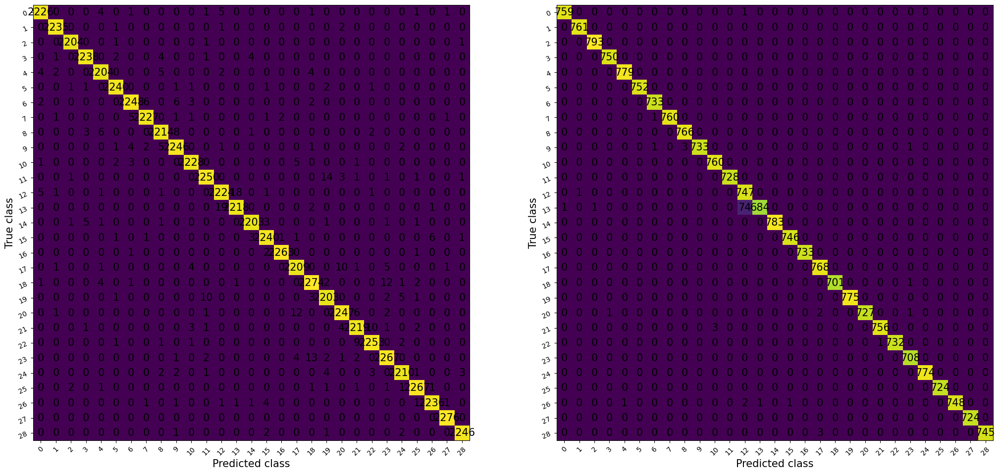

Valid Epoch [3/4] : 100%|██████████| 340/340 [00:58<00:00,  5.82batch/s, accuracy=84.4, f1=100, loss=0.00738]


Epoch 3, mean train loss: 0.02, train accuracy: 99.62, Train f1_score: 99.42, mean valid loss: 0.02, valid accuracy: 99.59, Valid f1_score: 99.37


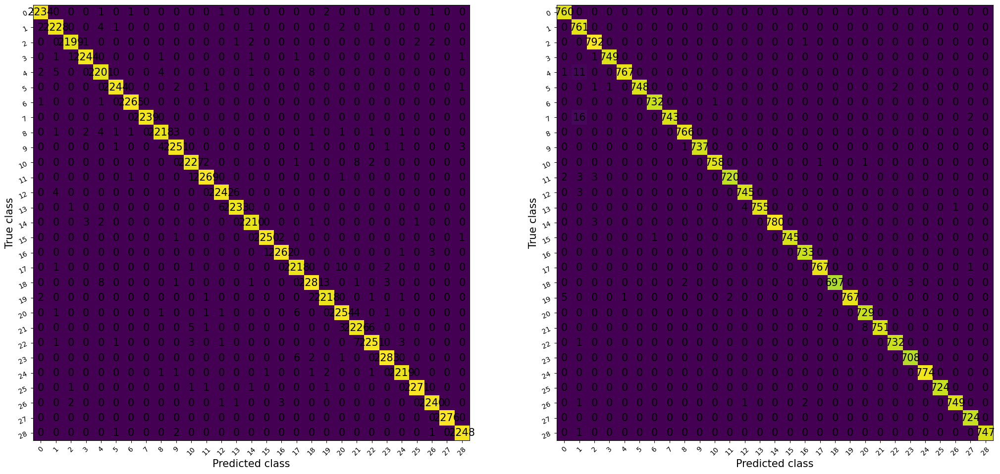

Valid Epoch [4/4] : 100%|██████████| 340/340 [00:57<00:00,  5.91batch/s, accuracy=84.4, f1=100, loss=0.00081]


Epoch 4, mean train loss: 0.02, train accuracy: 99.54, Train f1_score: 99.32, mean valid loss: 0.00, valid accuracy: 99.88, Valid f1_score: 99.82


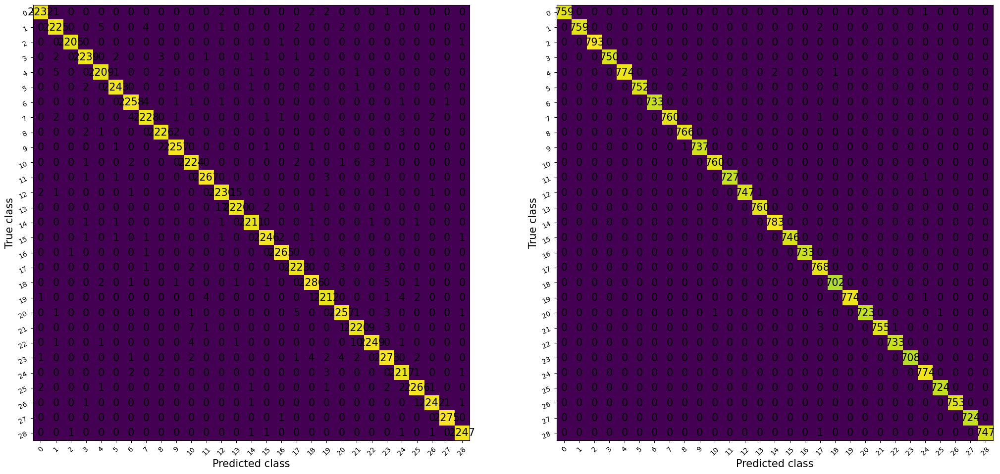

In [ ]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

train_test_model(model, optimizer, loss_fn)

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

torch.cuda.empty_cache()
gc.collect()

0

### ResNet18

In [ ]:
weights = torchvision.models.ResNet18_Weights.DEFAULT
model = torchvision.models.resnet18(weights=weights).to(device)

model.__class__.__name__ = "ResNet18"

# model_summary(model)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 153MB/s]


In [ ]:
for param in model.conv1.parameters():
    param.requires_grad = False

for param in model.bn1.parameters():
    param.requires_grad = False

for param in model.layer1.parameters():
    param.requires_grad = False
for param in model.layer2.parameters():
    param.requires_grad = False
for param in model.layer3.parameters():
    param.requires_grad = False
for param in model.layer4.parameters():
    param.requires_grad = False

model.fc = torch.nn.Sequential(
    torch.nn.Linear(in_features=512,
                    out_features=256,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    torch.nn.Linear(in_features=256,
                    out_features=29,
                    bias=True)).to(device)

model_summary(model)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet18 (ResNet18)                      [64, 3, 200, 200]    [64, 29]             --                   Partial
├─Conv2d (conv1)                         [64, 3, 200, 200]    [64, 64, 100, 100]   (9,408)              False
├─BatchNorm2d (bn1)                      [64, 64, 100, 100]   [64, 64, 100, 100]   (128)                False
├─ReLU (relu)                            [64, 64, 100, 100]   [64, 64, 100, 100]   --                   --
├─MaxPool2d (maxpool)                    [64, 64, 100, 100]   [64, 64, 50, 50]     --                   --
├─Sequential (layer1)                    [64, 64, 50, 50]     [64, 64, 50, 50]     --                   False
│    └─BasicBlock (0)                    [64, 64, 50, 50]     [64, 64, 50, 50]     --                   False
│    │    └─Conv2d (conv1)               [64, 64, 50, 50]     [64, 64, 50, 50]     (36,864)             False
│    │    

Valid Epoch [1/4] : 100%|██████████| 340/340 [00:57<00:00,  5.90batch/s, accuracy=79.7, f1=85.9, loss=0.16]


Epoch 1, mean train loss: 0.54, train accuracy: 84.62, Train f1_score: 80.72, mean valid loss: 0.24, valid accuracy: 92.10, Valid f1_score: 89.32


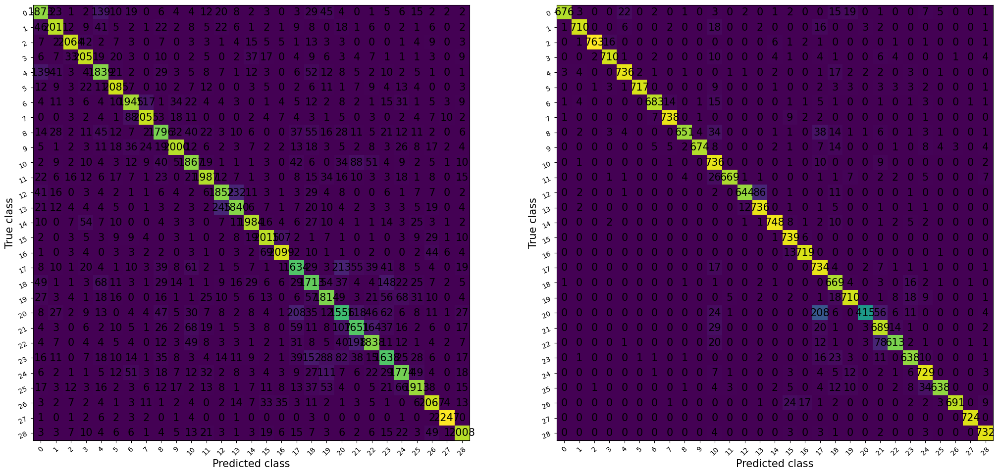

Valid Epoch [2/4] : 100%|██████████| 340/340 [01:01<00:00,  5.53batch/s, accuracy=81.2, f1=92.9, loss=0.241]


Epoch 2, mean train loss: 0.21, train accuracy: 92.99, Train f1_score: 90.53, mean valid loss: 0.17, valid accuracy: 94.28, Valid f1_score: 92.30


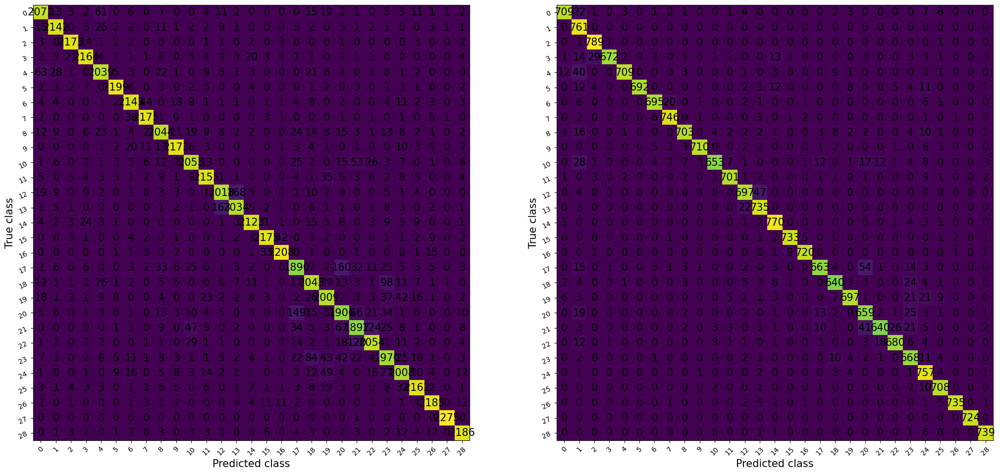

Valid Epoch [3/4] : 100%|██████████| 340/340 [00:52<00:00,  6.46batch/s, accuracy=79.7, f1=94.1, loss=0.0887]


Epoch 3, mean train loss: 0.16, train accuracy: 94.50, Train f1_score: 92.27, mean valid loss: 0.16, valid accuracy: 94.80, Valid f1_score: 92.98


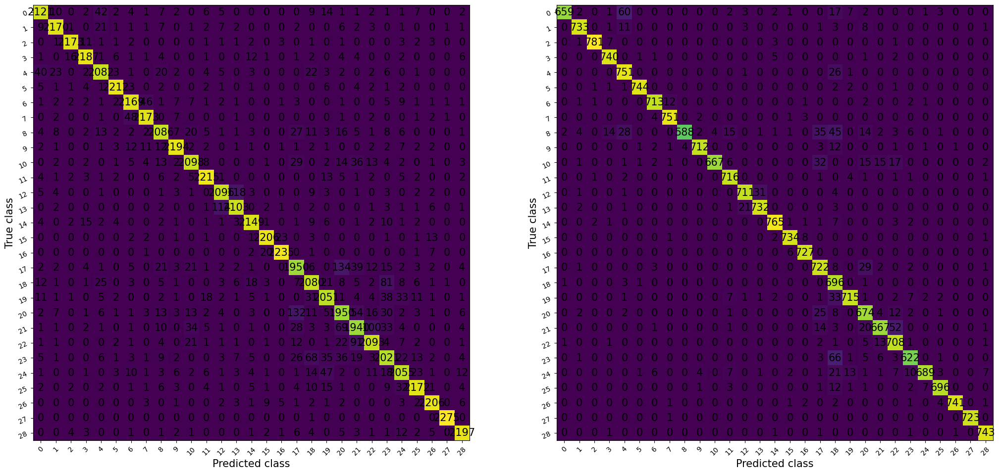

Valid Epoch [4/4] : 100%|██████████| 340/340 [00:51<00:00,  6.55batch/s, accuracy=81.2, f1=94.4, loss=0.102]


Epoch 4, mean train loss: 0.14, train accuracy: 95.08, Train f1_score: 93.19, mean valid loss: 0.15, valid accuracy: 94.92, Valid f1_score: 92.97


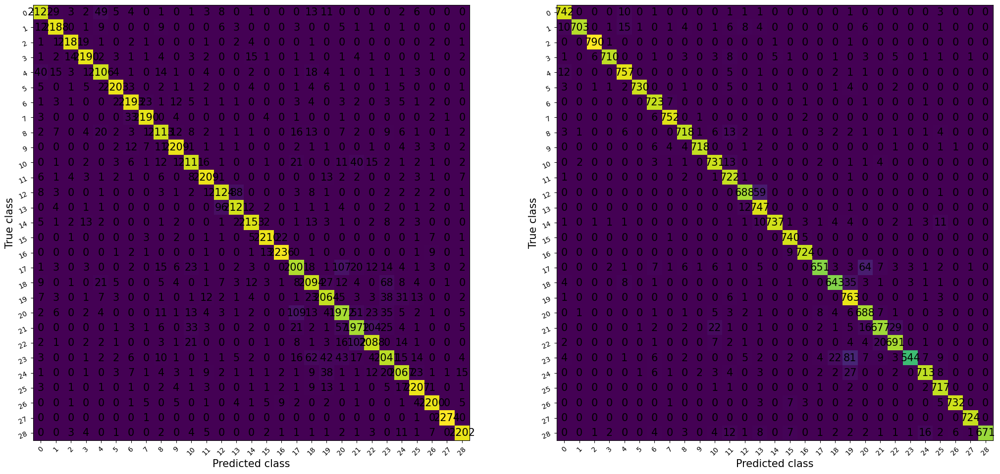

In [ ]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

train_test_model(model, optimizer, loss_fn)

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

torch.cuda.empty_cache()
gc.collect()

0

### ResNet50

In [ ]:
weights = torchvision.models.ResNet50_Weights.DEFAULT
model = torchvision.models.resnet50(weights=weights).to(device)

model.__class__.__name__ = "ResNet50"
# model_summary(model)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 135MB/s]


In [ ]:
for param in model.conv1.parameters():
    param.requires_grad = False

for param in model.bn1.parameters():
    param.requires_grad = False

for param in model.layer1.parameters():
    param.requires_grad = False
for param in model.layer2.parameters():
    param.requires_grad = False
for param in model.layer3.parameters():
    param.requires_grad = False
for param in model.layer4.parameters():
    param.requires_grad = False

model.fc = torch.nn.Sequential(
    torch.nn.Linear(in_features=2048,
                    out_features=1024,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    torch.nn.Linear(in_features=1024,
                    out_features=512,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    torch.nn.Linear(in_features=512,
                    out_features=256,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    torch.nn.Linear(in_features=256,
                    out_features=29,
                    bias=True)).to(device)

model_summary(model)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet50 (ResNet50)                      [64, 3, 200, 200]    [64, 29]             --                   Partial
├─Conv2d (conv1)                         [64, 3, 200, 200]    [64, 64, 100, 100]   (9,408)              False
├─BatchNorm2d (bn1)                      [64, 64, 100, 100]   [64, 64, 100, 100]   (128)                False
├─ReLU (relu)                            [64, 64, 100, 100]   [64, 64, 100, 100]   --                   --
├─MaxPool2d (maxpool)                    [64, 64, 100, 100]   [64, 64, 50, 50]     --                   --
├─Sequential (layer1)                    [64, 64, 50, 50]     [64, 256, 50, 50]    --                   False
│    └─Bottleneck (0)                    [64, 64, 50, 50]     [64, 256, 50, 50]    --                   False
│    │    └─Conv2d (conv1)               [64, 64, 50, 50]     [64, 64, 50, 50]     (4,096)              False
│    │    

Valid Epoch [1/4] : 100%|██████████| 340/340 [01:14<00:00,  4.58batch/s, accuracy=76.6, f1=88.4, loss=0.329]


Epoch 1, mean train loss: 0.51, train accuracy: 83.77, Train f1_score: 79.25, mean valid loss: 0.30, valid accuracy: 90.19, Valid f1_score: 86.99


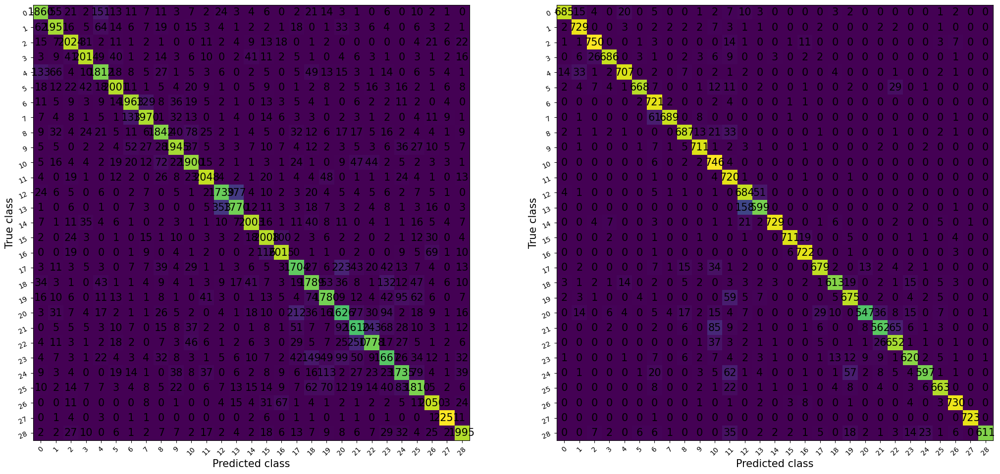

Valid Epoch [2/4] : 100%|██████████| 340/340 [01:16<00:00,  4.43batch/s, accuracy=76.6, f1=89, loss=0.299]


Epoch 2, mean train loss: 0.25, train accuracy: 92.06, Train f1_score: 89.22, mean valid loss: 0.33, valid accuracy: 90.28, Valid f1_score: 86.98


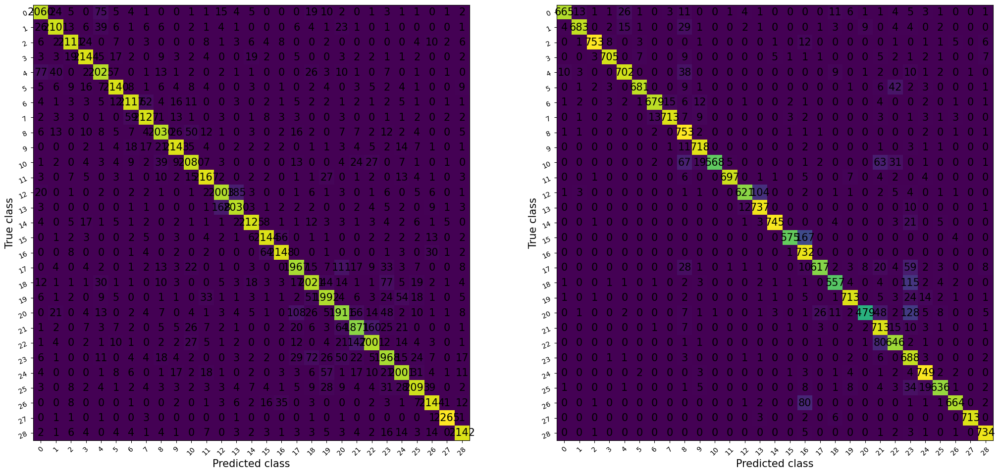

Valid Epoch [3/4] : 100%|██████████| 340/340 [01:14<00:00,  4.54batch/s, accuracy=75, f1=90.1, loss=0.362]


Epoch 3, mean train loss: 0.22, train accuracy: 93.29, Train f1_score: 90.81, mean valid loss: 0.27, valid accuracy: 92.41, Valid f1_score: 89.91


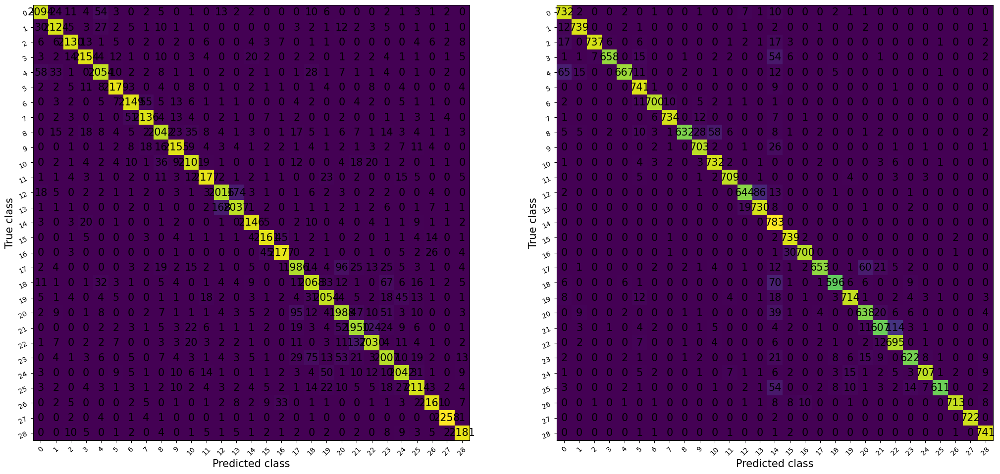

Valid Epoch [4/4] : 100%|██████████| 340/340 [01:15<00:00,  4.50batch/s, accuracy=75, f1=82.5, loss=0.505]


Epoch 4, mean train loss: 0.18, train accuracy: 94.54, Train f1_score: 92.43, mean valid loss: 0.24, valid accuracy: 93.14, Valid f1_score: 90.62


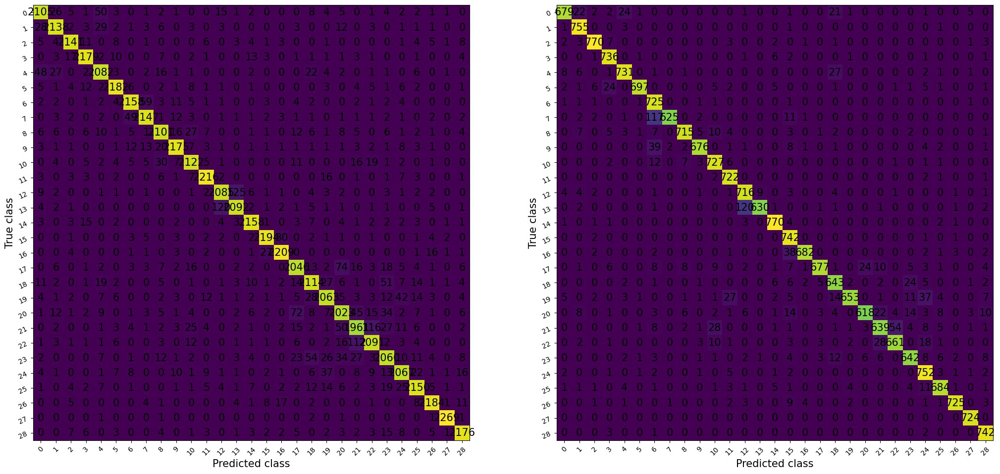

In [ ]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

train_test_model(model, optimizer, loss_fn)

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

torch.cuda.empty_cache()
gc.collect()

0

### ResNet152

In [ ]:
weights = torchvision.models.ResNet152_Weights.DEFAULT
model = torchvision.models.resnet152(weights=weights).to(device)

model.__class__.__name__ = "ResNet152"
# model_summary(model)

Downloading: "https://download.pytorch.org/models/resnet152-f82ba261.pth" to /root/.cache/torch/hub/checkpoints/resnet152-f82ba261.pth
100%|██████████| 230M/230M [00:01<00:00, 164MB/s]


In [ ]:
for param in model.conv1.parameters():
    param.requires_grad = False

for param in model.bn1.parameters():
    param.requires_grad = False

for param in model.layer1.parameters():
    param.requires_grad = False
for param in model.layer2.parameters():
    param.requires_grad = False
for param in model.layer3.parameters():
    param.requires_grad = False
for param in model.layer4.parameters():
    param.requires_grad = False

model.fc = torch.nn.Sequential(
    torch.nn.Linear(in_features=2048,
                    out_features=1024,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    torch.nn.Linear(in_features=1024,
                    out_features=512,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    torch.nn.Linear(in_features=512,
                    out_features=256,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    torch.nn.Linear(in_features=256,
                    out_features=29,
                    bias=True)).to(device)

model_summary(model)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet152 (ResNet152)                    [64, 3, 200, 200]    [64, 29]             --                   Partial
├─Conv2d (conv1)                         [64, 3, 200, 200]    [64, 64, 100, 100]   (9,408)              False
├─BatchNorm2d (bn1)                      [64, 64, 100, 100]   [64, 64, 100, 100]   (128)                False
├─ReLU (relu)                            [64, 64, 100, 100]   [64, 64, 100, 100]   --                   --
├─MaxPool2d (maxpool)                    [64, 64, 100, 100]   [64, 64, 50, 50]     --                   --
├─Sequential (layer1)                    [64, 64, 50, 50]     [64, 256, 50, 50]    --                   False
│    └─Bottleneck (0)                    [64, 64, 50, 50]     [64, 256, 50, 50]    --                   False
│    │    └─Conv2d (conv1)               [64, 64, 50, 50]     [64, 64, 50, 50]     (4,096)              False
│    │    

Valid Epoch [1/4] : 100%|██████████| 340/340 [01:55<00:00,  2.95batch/s, accuracy=78.1, f1=90.7, loss=0.221]


Epoch 1, mean train loss: 0.48, train accuracy: 84.65, Train f1_score: 80.28, mean valid loss: 0.26, valid accuracy: 91.71, Valid f1_score: 88.96


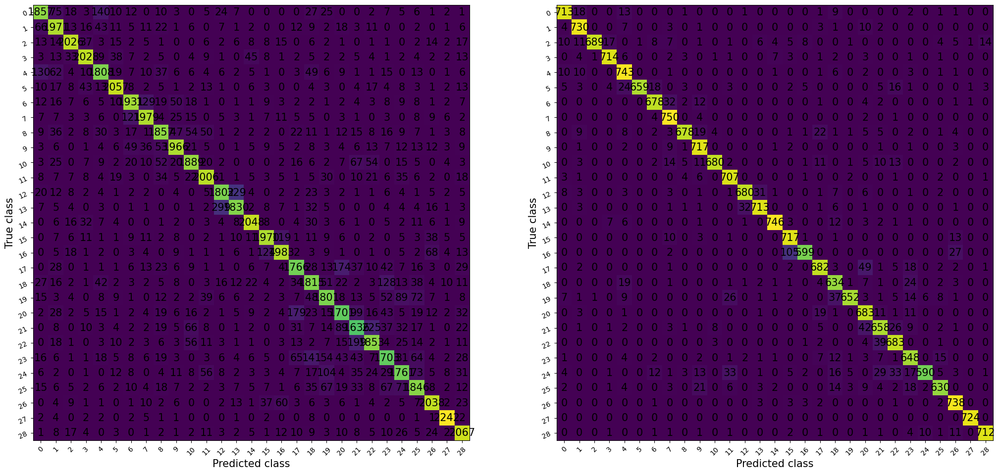

Valid Epoch [2/4] : 100%|██████████| 340/340 [01:55<00:00,  2.94batch/s, accuracy=81.2, f1=96.3, loss=0.166]


Epoch 2, mean train loss: 0.24, train accuracy: 92.59, Train f1_score: 89.79, mean valid loss: 0.28, valid accuracy: 92.02, Valid f1_score: 89.39


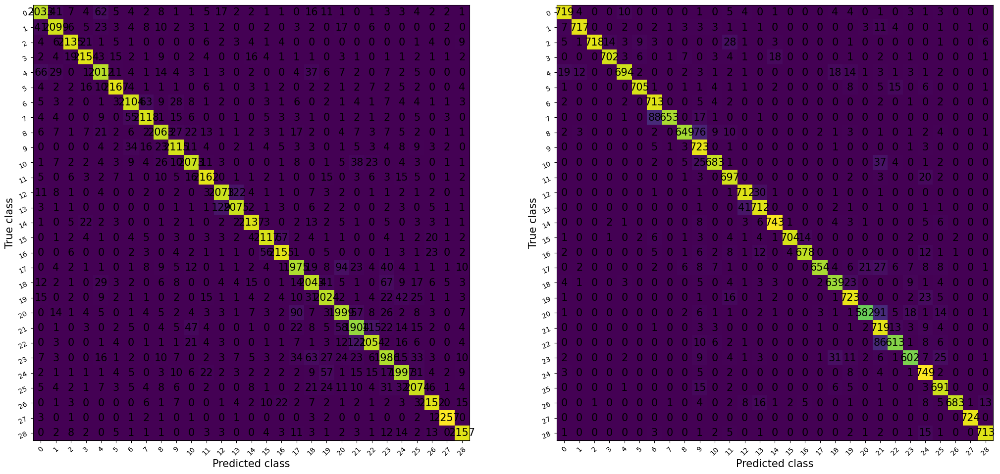

Valid Epoch [3/4] : 100%|██████████| 340/340 [01:55<00:00,  2.96batch/s, accuracy=82.8, f1=98.2, loss=0.147]


Epoch 3, mean train loss: 0.21, train accuracy: 93.71, Train f1_score: 91.29, mean valid loss: 0.24, valid accuracy: 93.24, Valid f1_score: 90.80


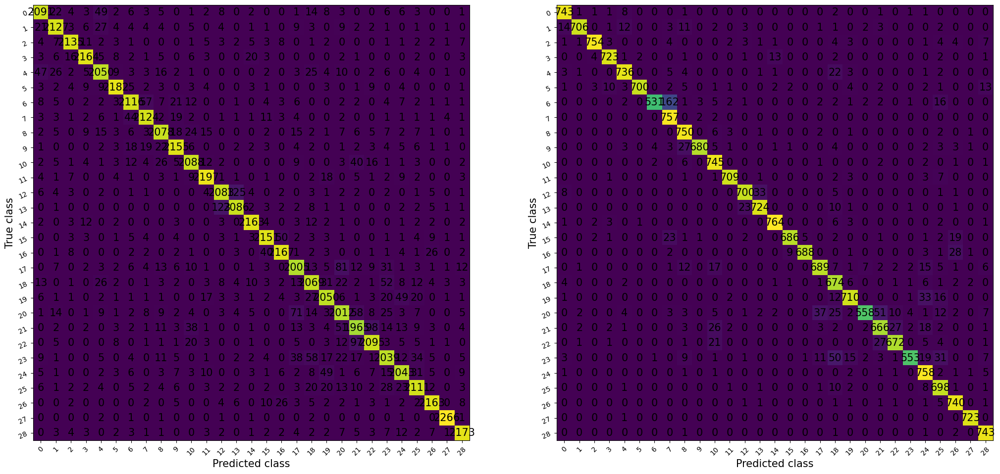

Valid Epoch [4/4] : 100%|██████████| 340/340 [01:55<00:00,  2.95batch/s, accuracy=78.1, f1=92.7, loss=0.176]


Epoch 4, mean train loss: 0.16, train accuracy: 95.14, Train f1_score: 93.17, mean valid loss: 0.22, valid accuracy: 93.66, Valid f1_score: 91.27


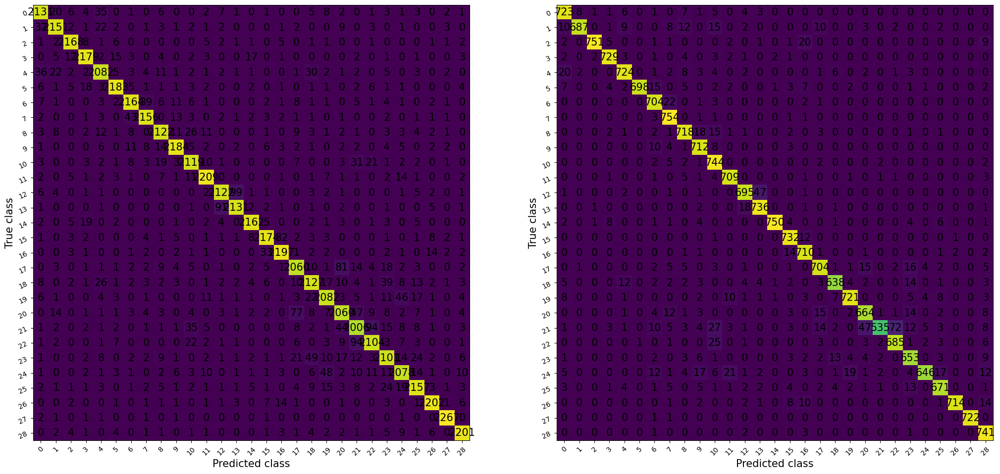

In [ ]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

train_test_model(model, optimizer, loss_fn)

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

torch.cuda.empty_cache()
gc.collect()

0

### VGG11

In [ ]:
weights = torchvision.models.VGG11_Weights.DEFAULT
model = torchvision.models.vgg11(weights=weights).to(device)

model.__class__.__name__ = "VGG11"
# model_summary(model)

Downloading: "https://download.pytorch.org/models/vgg11-8a719046.pth" to /root/.cache/torch/hub/checkpoints/vgg11-8a719046.pth
100%|██████████| 507M/507M [00:03<00:00, 157MB/s]


In [ ]:
for param in model.features.parameters():
    param.requires_grad = False

model.classifier = torch.nn.Sequential(
    nn.Dropout(0.2, inplace=True),
    torch.nn.Linear(in_features=25088,
                    out_features=4096,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    nn.Dropout(0.2, inplace=True),
    torch.nn.Linear(in_features=4096,
                    out_features=1024,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    nn.Dropout(0.2, inplace=True),
    torch.nn.Linear(in_features=1024,
                    out_features=29,
                    bias=True)).to(device)

model_summary(model)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
VGG11 (VGG11)                            [64, 3, 200, 200]    [64, 29]             --                   Partial
├─Sequential (features)                  [64, 3, 200, 200]    [64, 512, 6, 6]      --                   False
│    └─Conv2d (0)                        [64, 3, 200, 200]    [64, 64, 200, 200]   (1,792)              False
│    └─ReLU (1)                          [64, 64, 200, 200]   [64, 64, 200, 200]   --                   --
│    └─MaxPool2d (2)                     [64, 64, 200, 200]   [64, 64, 100, 100]   --                   --
│    └─Conv2d (3)                        [64, 64, 100, 100]   [64, 128, 100, 100]  (73,856)             False
│    └─ReLU (4)                          [64, 128, 100, 100]  [64, 128, 100, 100]  --                   --
│    └─MaxPool2d (5)                     [64, 128, 100, 100]  [64, 128, 50, 50]    --                   --
│    └─Conv2d (6

Valid Epoch [1/4] : 100%|██████████| 340/340 [01:07<00:00,  5.04batch/s, accuracy=75, f1=86.1, loss=20.8]


Epoch 1, mean train loss: 5.32, train accuracy: 84.78, Train f1_score: 80.68, mean valid loss: 20.14, valid accuracy: 88.61, Valid f1_score: 84.92


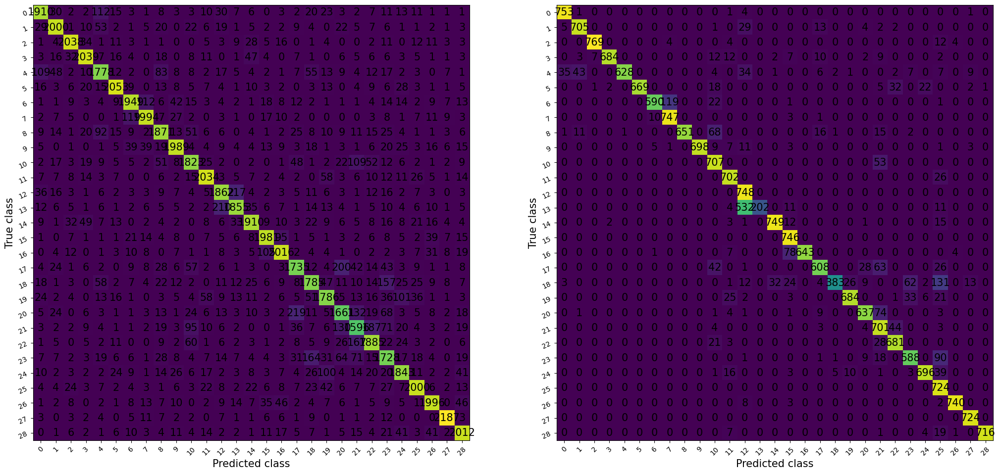

Valid Epoch [2/4] : 100%|██████████| 340/340 [01:07<00:00,  5.05batch/s, accuracy=78.1, f1=92.7, loss=4.66]


Epoch 2, mean train loss: 9.73, train accuracy: 95.20, Train f1_score: 93.33, mean valid loss: 9.50, valid accuracy: 96.45, Valid f1_score: 95.15


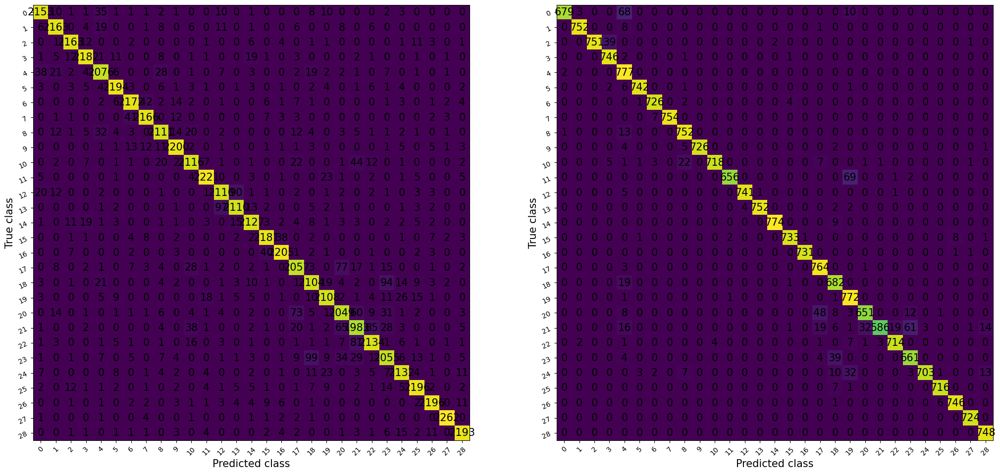

Valid Epoch [3/4] : 100%|██████████| 340/340 [01:06<00:00,  5.13batch/s, accuracy=81.2, f1=93.6, loss=5.95]


Epoch 3, mean train loss: 8.66, train accuracy: 97.46, Train f1_score: 96.35, mean valid loss: 9.74, valid accuracy: 97.60, Valid f1_score: 96.64


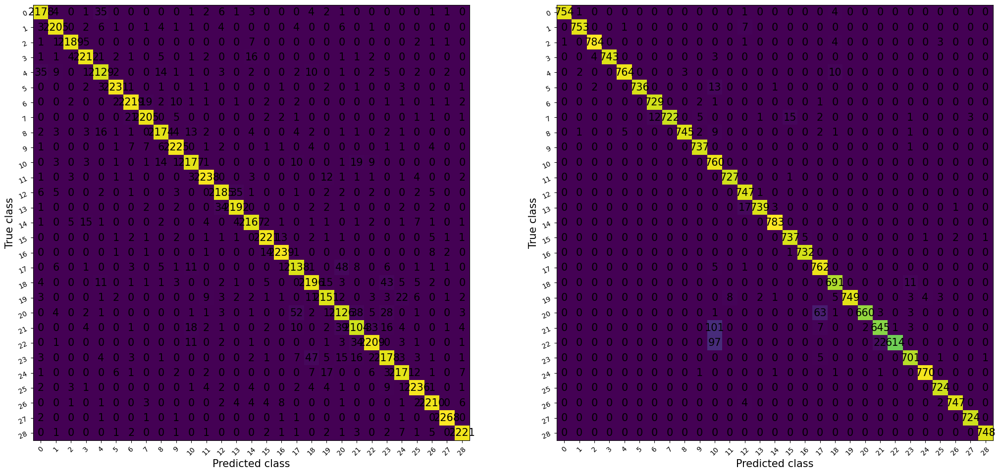

Valid Epoch [4/4] : 100%|██████████| 340/340 [01:06<00:00,  5.13batch/s, accuracy=84.4, f1=100, loss=0]


Epoch 4, mean train loss: 9.81, train accuracy: 98.03, Train f1_score: 97.33, mean valid loss: 5.23, valid accuracy: 98.82, Valid f1_score: 98.29


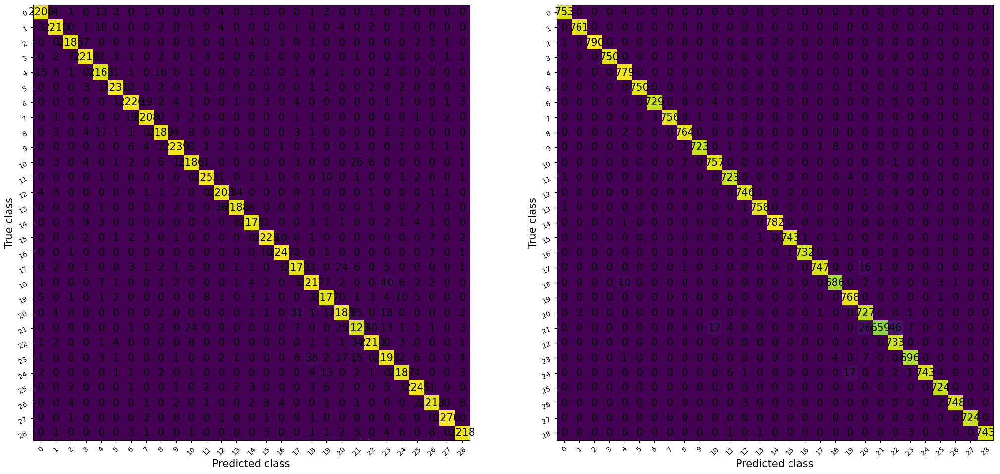

In [ ]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

train_test_model(model, optimizer, loss_fn)

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

torch.cuda.empty_cache()
gc.collect()

0

### VGG 16

In [ ]:
weights = torchvision.models.VGG16_Weights.DEFAULT
model = torchvision.models.vgg16(weights=weights).to(device)

model.__class__.__name__ = "VGG16"
# model_summary(model)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 153MB/s]


In [ ]:
for param in model.features.parameters():
    param.requires_grad = False

model.classifier = torch.nn.Sequential(
    nn.Dropout(0.2, inplace=True),
    torch.nn.Linear(in_features=25088,
                    out_features=4096,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    nn.Dropout(0.2, inplace=True),
    torch.nn.Linear(in_features=4096,
                    out_features=1024,
                    bias=True),
#     torch.nn.ReLU(inplace=True),
    nn.Dropout(0.2, inplace=True),
    torch.nn.Linear(in_features=1024,
                    out_features=29,
                    bias=True)).to(device)

model_summary(model)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
VGG16 (VGG16)                            [64, 3, 200, 200]    [64, 29]             --                   Partial
├─Sequential (features)                  [64, 3, 200, 200]    [64, 512, 6, 6]      --                   False
│    └─Conv2d (0)                        [64, 3, 200, 200]    [64, 64, 200, 200]   (1,792)              False
│    └─ReLU (1)                          [64, 64, 200, 200]   [64, 64, 200, 200]   --                   --
│    └─Conv2d (2)                        [64, 64, 200, 200]   [64, 64, 200, 200]   (36,928)             False
│    └─ReLU (3)                          [64, 64, 200, 200]   [64, 64, 200, 200]   --                   --
│    └─MaxPool2d (4)                     [64, 64, 200, 200]   [64, 64, 100, 100]   --                   --
│    └─Conv2d (5)                        [64, 64, 100, 100]   [64, 128, 100, 100]  (73,856)             False
│    └─ReLU (

Valid Epoch [1/4] : 100%|██████████| 340/340 [01:26<00:00,  3.91batch/s, accuracy=73.4, f1=82, loss=17.4]


Epoch 1, mean train loss: 4.70, train accuracy: 84.74, Train f1_score: 80.84, mean valid loss: 11.65, valid accuracy: 89.62, Valid f1_score: 86.28


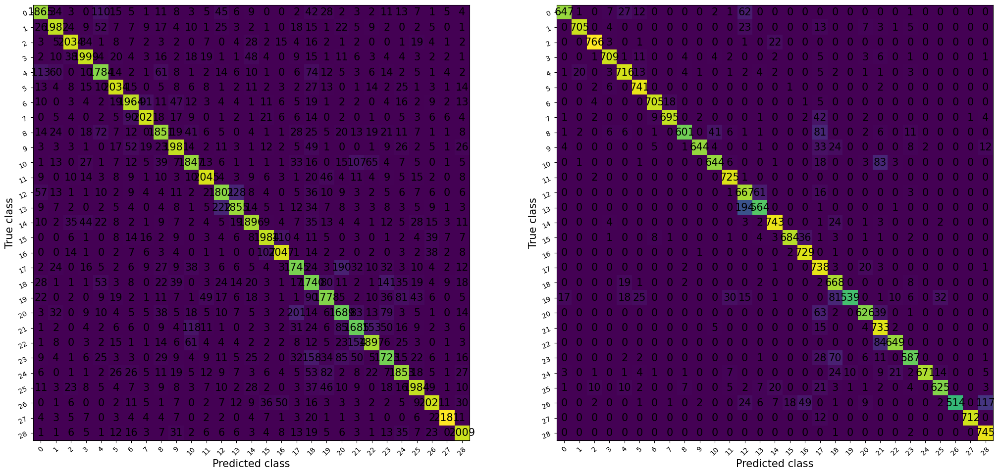

Valid Epoch [2/4] : 100%|██████████| 340/340 [01:35<00:00,  3.57batch/s, accuracy=82.8, f1=97.7, loss=14.9]


Epoch 2, mean train loss: 11.44, train accuracy: 94.16, Train f1_score: 91.90, mean valid loss: 8.65, valid accuracy: 96.74, Valid f1_score: 95.42


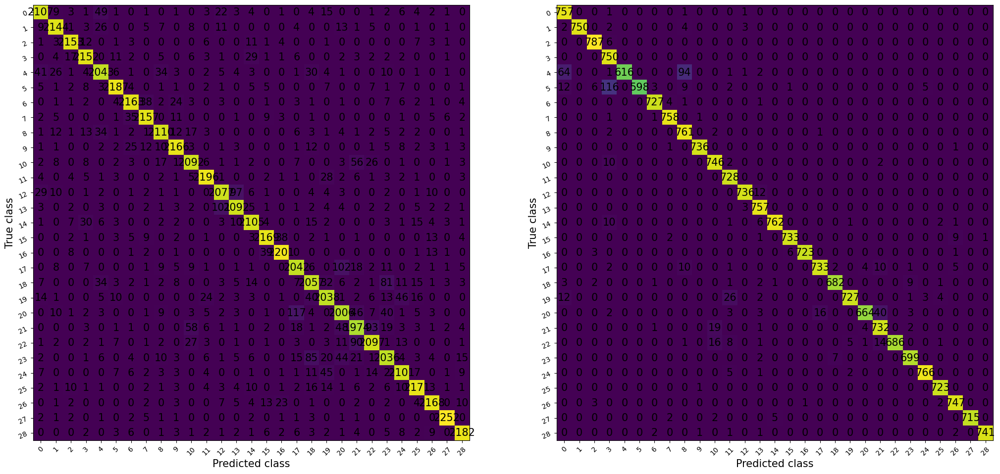

Valid Epoch [3/4] : 100%|██████████| 340/340 [01:27<00:00,  3.90batch/s, accuracy=82.8, f1=95.4, loss=2.19]


Epoch 3, mean train loss: 10.45, train accuracy: 97.03, Train f1_score: 95.88, mean valid loss: 20.72, valid accuracy: 96.22, Valid f1_score: 94.75


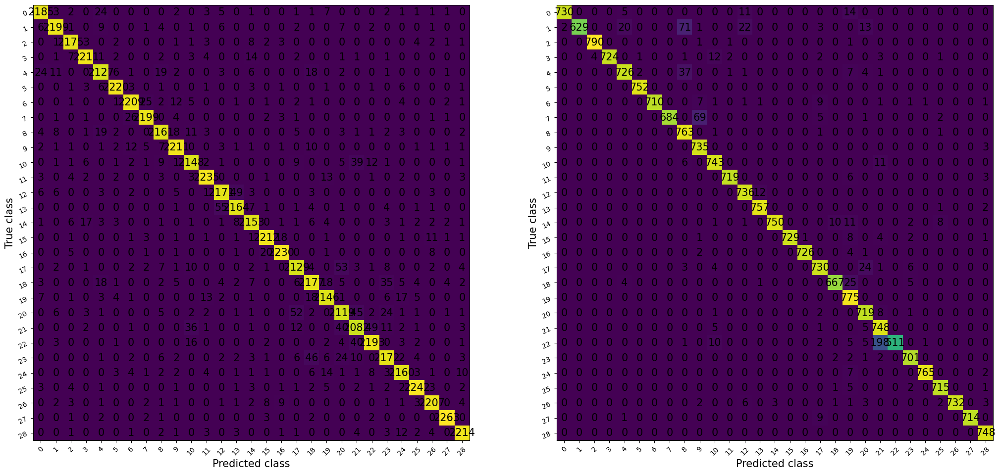

Valid Epoch [4/4] : 100%|██████████| 340/340 [01:26<00:00,  3.92batch/s, accuracy=82.8, f1=98.5, loss=17.8]


Epoch 4, mean train loss: 13.03, train accuracy: 97.64, Train f1_score: 96.73, mean valid loss: 17.93, valid accuracy: 97.49, Valid f1_score: 96.38


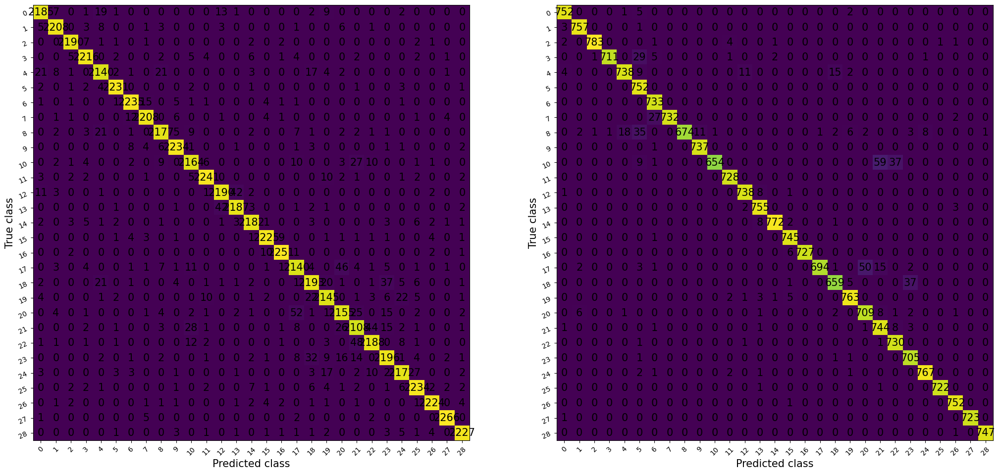

In [ ]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

train_test_model(model, optimizer, loss_fn)

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

torch.cuda.empty_cache()
gc.collect()

0

# Conclusion

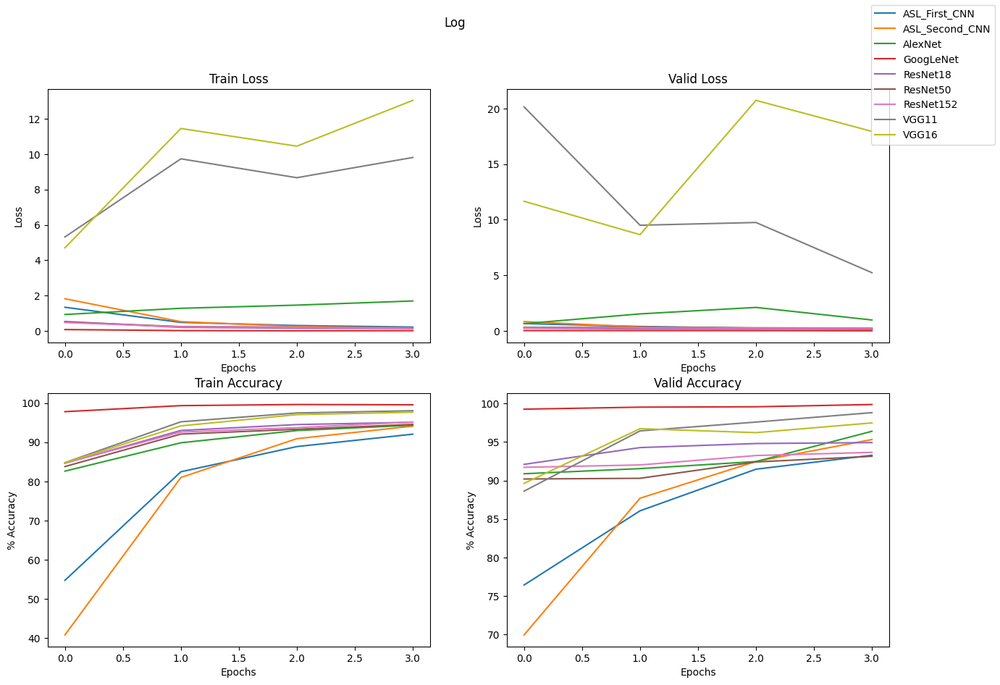

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(15,10))

for _name in TRAIN_LOSS_LOG.keys():
    TRAIN_LOSS_LOG[_name] = torch.tensor(TRAIN_LOSS_LOG[_name], device = 'cpu')
    ax[0][0].plot(TRAIN_LOSS_LOG[_name])
ax[0][0].set_title('Train Loss')
ax[0][0].set_ylabel('Loss')
ax[0][0].set_xlabel('Epochs')

for _name in TRAIN_ACC_LOG.keys():
    TRAIN_ACC_LOG[_name] = torch.tensor(TRAIN_ACC_LOG[_name], device = 'cpu')
    ax[1][0].plot(TRAIN_ACC_LOG[_name])
ax[1][0].set_title('Train Accuracy')
ax[1][0].set_ylabel('% Accuracy')
ax[1][0].set_xlabel('Epochs')

for _name in VALID_LOSS_LOG.keys():
    VALID_LOSS_LOG[_name] = torch.tensor(VALID_LOSS_LOG[_name], device = 'cpu')
    ax[0][1].plot(VALID_LOSS_LOG[_name])
ax[0][1].set_title('Valid Loss')
ax[0][1].set_ylabel('Loss')
ax[0][1].set_xlabel('Epochs')

for _name in VALID_ACC_LOG.keys():
    VALID_ACC_LOG[_name] = torch.tensor(VALID_ACC_LOG[_name], device = 'cpu')
    ax[1][1].plot(VALID_ACC_LOG[_name])
ax[1][1].set_title('Valid Accuracy')
ax[1][1].set_ylabel('% Accuracy')
ax[1][1].set_xlabel('Epochs')

for _name in TRAIN_F1_LOG.keys():
    TRAIN_F1_LOG[_name] = torch.tensor(TRAIN_F1_LOG[_name], device = 'cpu')
    ax[0][1].plot(TRAIN_F1_LOG[_name])
ax[0][1].set_title('Train F1')
ax[0][1].set_ylabel('Loss')
ax[0][1].set_xlabel('Epochs')

for _name in VALID_F1_LOG.keys():
    VALID_F1_LOG[_name] = torch.tensor(VALID_F1_LOG[_name], device = 'cpu')
    ax[1][1].plot(VALID_F1_LOG[_name])
ax[1][1].set_title('Valid F1')
ax[1][1].set_ylabel('% Accuracy')
ax[1][1].set_xlabel('Epochs')

fig.suptitle("Log")
fig.legend(["ASL_First_CNN", "ASL_Second_CNN", "AlexNet", "GoogLeNet", "ResNet18", "ResNet50", "ResNet152", "VGG11", "VGG16"])
plt.show()

In [2]:
TRAIN_F1_LOG = {
    "ASL_First_CNN": [48.08,77.27,85.07,89.19],
    "ASL_Second_CNN" : [34.55,75.88,87.76,91.82],
    "AlexNet" : [77.98,86.50,90.35,92.37],
    "GoogLeNet" : [97.12,98.93,99.42,99.32],
    "ResNet18" : [80.72,90.53,92.27,93.19],
    "ResNet50" : [79.25,89.22,90.81,92.43],
    "ResNet152" : [80.28,89.79,91.29,93.17],
    "VGG11": [80.68,93.33,96.35,97.33],
    "VGG16": [80.84,91.90,95.88,96.73]
}

VALID_F1_LOG = {
    "ASL_First_CNN": [70.07, 81.87,88.56,90.95],
    "ASL_Second_CNN" : [62.90,83.64,89.87,93.48],
    "AlexNet" : [87.79,88.79,89.92,94.92],
    "GoogLeNet" : [98.80, 99.27,99.37,99.82],
    "ResNet18" : [89.32,92.30,92.98,92.97],
    "ResNet50" : [86.99,86.98,89.91,90.62],
    "ResNet152" : [88.96,89.39,90.80,91.27],
    "VGG11": [84.92,95.15,96.64,98.29],
    "VGG16": [86.28,95.42,94.75,96.38]
}

<ipython-input-7-cafbce5c1b60>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  TRAIN_F1_LOG[_name] = torch.tensor(TRAIN_F1_LOG[_name], device = 'cpu')
<ipython-input-7-cafbce5c1b60>:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  VALID_F1_LOG[_name] = torch.tensor(VALID_F1_LOG[_name], device = 'cpu')


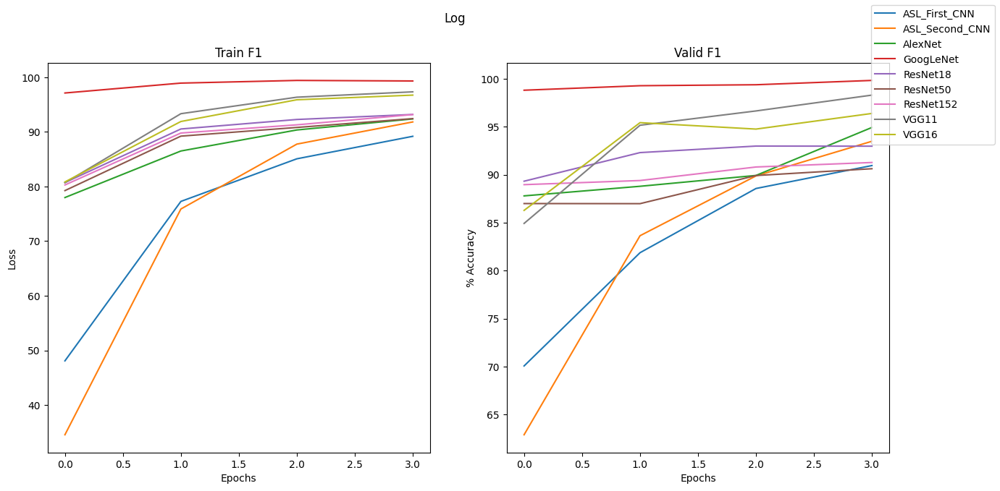

In [7]:
from matplotlib import pyplot as plt
import torch

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,7))

for _name in TRAIN_F1_LOG.keys():
    TRAIN_F1_LOG[_name] = torch.tensor(TRAIN_F1_LOG[_name], device = 'cpu')
    ax[0].plot(TRAIN_F1_LOG[_name])
ax[0].set_title('Train F1')
ax[0].set_ylabel('Loss')
ax[0].set_xlabel('Epochs')

for _name in VALID_F1_LOG.keys():
    VALID_F1_LOG[_name] = torch.tensor(VALID_F1_LOG[_name], device = 'cpu')
    ax[1].plot(VALID_F1_LOG[_name])
ax[1].set_title('Valid F1')
ax[1].set_ylabel('% Accuracy')
ax[1].set_xlabel('Epochs')

fig.suptitle("Log")
fig.legend(["ASL_First_CNN", "ASL_Second_CNN", "AlexNet", "GoogLeNet", "ResNet18", "ResNet50", "ResNet152", "VGG11", "VGG16"])
plt.show()